**Dementia Patient Health,Prescriptions**
Group number 18




שירה רוט
עדי חלילי
שיר ירון


In [614]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder
import array as arr



In [615]:
url="https://raw.githubusercontent.com/adihalili/project1/main/dementia_patients_health_data.csv"
dmn_df = pd.read_csv(url)
dmn_df.head(10)

,Diabetic,AlcoholLevel,HeartRate,BloodOxygenLevel,BodyTemperature,Weight,MRI_Delay,Prescription,Dosage in mg,Age,...,Smoking_Status,APOE_ε4,Physical_Activity,Depression_Status,Cognitive_Test_Scores,Medication_History,Nutrition_Diet,Sleep_Quality,Chronic_Health_Conditions,Dementia
0,1,0.084974,98,96.230743,36.224852,57.563978,36.421028,NaN,NaN,60,...,Current Smoker,Negative,Sedentary,No,10,No,Low-Carb Diet,Poor,Diabetes,0
1,0,0.016973,78,93.032122,36.183874,56.832335,31.157633,Galantamine,12.0,61,...,Former Smoker,Positive,Moderate Activity,No,1,Yes,Low-Carb Diet,Poor,Heart Disease,1
2,0,0.009000,89,93.566504,37.326321,59.759066,37.640435,NaN,NaN,69,...,Former Smoker,Negative,Moderate Activity,No,8,No,Mediterranean Diet,Poor,Heart Disease,0
3,0,0.086437,60,93.906510,37.030620,58.266471,50.673992,Donepezil,23.0,78,...,Never Smoked,Negative,Mild Activity,Yes,5,Yes,Balanced Diet,Poor,Hypertension,1
4,1,0.150747,67,97.508994,36.062121,67.705027,27.810601,Memantine,20.0,77,...,Never Smoked,Positive,Mild Activity,No,0,Yes,Low-Carb Diet,Good,Diabetes,1
5,1,0.114028,94,94.546754,36.678071,66.592329,21.154863,Rivastigmine,1.5,67,...,Former Smoker,Positive,Mild Activity,Yes,1,No,Low-Carb Diet,Poor,Diabetes,1
6,1,0.016194,90,96.423361,37.024630,83.976553,11.350612,Donepezil,10.0,87,...,Never Smoked,Positive,Mild Activity,No,7,No,Mediterranean Diet,Poor,Diabetes,1
7,0,0.161158,98,92.007370,36.050294,69.653564,30.339413,NaN,NaN,66,...,Former Smoker,Negative,Mild Activity,No,9,Yes,Low-Carb Diet,Poor,Hypertension,0
8,0,0.015754,69,99.859490,36.955259,53.725078,36.629687,NaN,NaN,66,...,Former Smoker,Positive,Mild Activity,No,10,Yes,Mediterranean Diet,Poor,NaN,0
9,1,0.097340,64,90.319068,36.396286,58.366698,49.175758,Rivastigmine,3.0,87,...,Former Smoker,Positive,Sedentary,Yes,7,Yes,Balanced Diet,Good,Diabetes,1


In [616]:
dmn_df.shape

(1000, 24)

In [617]:
dmn_df.values

array([[1, 0.084973629, 98, ..., 'Poor', 'Diabetes', 0],
       [0, 0.016972773, 78, ..., 'Poor', 'Heart Disease', 1],
       [0, 0.00900025, 89, ..., 'Poor', 'Heart Disease', 0],
       ...,
       [1, 0.073691785, 65, ..., 'Good', 'Diabetes', 0],
       [0, 0.037347233, 71, ..., 'Good', nan, 1],
       [0, 0.085969401, 90, ..., 'Good', 'Heart Disease', 0]],
      dtype=object)

In [618]:
dmn_df.index

RangeIndex(start=0, stop=1000, step=1)

In [619]:
dmn_df.columns

Index(['Diabetic', 'AlcoholLevel', 'HeartRate', 'BloodOxygenLevel',
       'BodyTemperature', 'Weight', 'MRI_Delay', 'Prescription',
       'Dosage in mg', 'Age', 'Education_Level', 'Dominant_Hand', 'Gender',
       'Family_History', 'Smoking_Status', 'APOE_ε4', 'Physical_Activity',
       'Depression_Status', 'Cognitive_Test_Scores', 'Medication_History',
       'Nutrition_Diet', 'Sleep_Quality', 'Chronic_Health_Conditions',
       'Dementia'],
      dtype='object')

In [620]:
d_sick=dmn_df[dmn_df['Dementia'==1]]
d_sick[d_sick['Gender'=="Female"]]

KeyError: False

In [ ]:
dmn_df['Gender']

In [ ]:
dmn_df.dtypes

In [622]:
data_dum = dmn_df.get_dummies(dmn_df["Education_Level"])
data_dum.columns

AttributeError: 'DataFrame' object has no attribute 'get_dummies'

In [623]:
d_by_age=dmn_df[dmn_df['Age']>=80]
d_by_age.shape

(361, 24)

In [624]:
corrs = dmn_df.corr(method = 'kendall', numeric_only=True)
corrs

,Diabetic,AlcoholLevel,HeartRate,BloodOxygenLevel,BodyTemperature,Weight,MRI_Delay,Dosage in mg,Age,Cognitive_Test_Scores,Dementia
Diabetic,1.000000,-0.020356,-0.006187,-0.013761,-0.044118,-0.006378,-0.016722,0.015623,0.000647,-0.038923,0.044815
AlcoholLevel,-0.020356,1.000000,-0.032145,-0.002134,0.019712,0.020641,0.002867,0.023088,-0.000242,-0.000520,-0.003451
HeartRate,-0.006187,-0.032145,1.000000,0.013155,0.013086,-0.000651,-0.001761,-0.030876,0.008721,0.005292,0.009269
BloodOxygenLevel,-0.013761,-0.002134,0.013155,1.000000,-0.002899,-0.026418,-0.004080,-0.019929,0.018400,0.043244,-0.058749
BodyTemperature,-0.044118,0.019712,0.013086,-0.002899,1.000000,-0.010851,0.011648,0.004007,0.001248,-0.015386,0.025721
Weight,-0.006378,0.020641,-0.000651,-0.026418,-0.010851,1.000000,-0.014963,-0.005217,0.008273,0.028305,-0.040131
MRI_Delay,-0.016722,0.002867,-0.001761,-0.004080,0.011648,-0.014963,1.000000,-0.089555,-0.000446,-0.033722,0.025415
Dosage in mg,0.015623,0.023088,-0.030876,-0.019929,0.004007,-0.005217,-0.089555,1.000000,-0.012608,-0.046953,NaN
Age,0.000647,-0.000242,0.008721,0.018400,0.001248,0.008273,-0.000446,-0.012608,1.000000,0.042662,-0.051506
Cognitive_Test_Scores,-0.038923,-0.000520,0.005292,0.043244,-0.015386,0.028305,-0.033722,-0.046953,0.042662,1.000000,-0.752736


<Axes: >

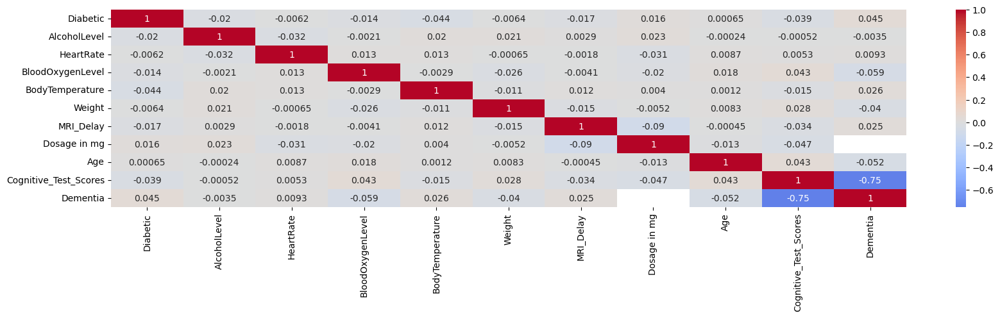

In [625]:
corrs = dmn_df.corr(method = 'kendall', numeric_only=True)
plt.figure(figsize=(20,4))  #figure size
sns.heatmap(corrs, cmap='coolwarm', center=0, annot = True)

In [626]:
data['Cognitive_Test_Scores']

0      10
1       1
2       8
3       5
4       0
       ..
995     5
996     9
997     8
998     2
999    10
Name: Cognitive_Test_Scores, Length: 1000, dtype: int64

In [627]:
dmn_df['Sleep_Quality'].unique()

array(['Poor', 'Good'], dtype=object)

In [628]:
dmn_df.describe()

,Diabetic,AlcoholLevel,HeartRate,BloodOxygenLevel,BodyTemperature,Weight,MRI_Delay,Dosage in mg,Age,Cognitive_Test_Scores,Dementia
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,485.000000,1000.000000,1000.000000,1000.000000
mean,0.513000,0.098429,79.383000,95.226051,36.761513,74.321326,30.103568,9.213402,74.908000,6.383000,0.485000
std,0.500081,0.058715,12.107556,2.929262,0.431701,14.463765,16.862170,6.493188,9.095068,3.180633,0.500025
min,0.000000,0.000414,60.000000,90.010677,36.002108,50.069731,0.094684,1.500000,60.000000,0.000000,0.000000
25%,0.000000,0.045505,68.000000,92.875017,36.395363,61.387339,16.237371,4.000000,67.000000,4.000000,0.000000
50%,1.000000,0.098235,79.000000,95.390420,36.784319,74.149204,29.577194,8.000000,75.000000,8.000000,0.000000
75%,1.000000,0.151840,90.000000,97.785111,37.126655,87.024034,44.176723,12.000000,83.000000,9.000000,1.000000
max,1.000000,0.199866,100.000000,99.999230,37.496809,99.982722,59.957599,23.000000,90.000000,10.000000,1.000000


In [629]:
dmn_df['Sleep_Quality']

0      Poor
1      Poor
2      Poor
3      Poor
4      Good
       ... 
995    Poor
996    Poor
997    Good
998    Good
999    Good
Name: Sleep_Quality, Length: 1000, dtype: object

In [630]:
dmn_df[['Sleep_Quality']]

,Sleep_Quality
0,Poor
1,Poor
2,Poor
3,Poor
4,Good
...,...
995,Poor
996,Poor
997,Good
998,Good


In [631]:
plt.figure(figsize=(6,3))

<Figure size 600x300 with 0 Axes>

<Figure size 600x300 with 0 Axes>

In [632]:
Educations={"Primary School":1, "Secondary School": 2, "No School": 0,"Diploma/Degree": 3}
Educations

{'Primary School': 1,
 'Secondary School': 2,
 'No School': 0,
 'Diploma/Degree': 3}

In [633]:
#data["Educations"]=data["Education_Level"].apply(lambada[x]:"Education"[x])


In [634]:
dmn_df.shape

(1000, 24)

In [635]:
dmn_df.columns

Index(['Diabetic', 'AlcoholLevel', 'HeartRate', 'BloodOxygenLevel',
       'BodyTemperature', 'Weight', 'MRI_Delay', 'Prescription',
       'Dosage in mg', 'Age', 'Education_Level', 'Dominant_Hand', 'Gender',
       'Family_History', 'Smoking_Status', 'APOE_ε4', 'Physical_Activity',
       'Depression_Status', 'Cognitive_Test_Scores', 'Medication_History',
       'Nutrition_Diet', 'Sleep_Quality', 'Chronic_Health_Conditions',
       'Dementia'],
      dtype='object')

In [636]:
dmn_df.isnull().sum()

Diabetic                       0
AlcoholLevel                   0
HeartRate                      0
BloodOxygenLevel               0
BodyTemperature                0
Weight                         0
MRI_Delay                      0
Prescription                 515
Dosage in mg                 515
Age                            0
Education_Level                0
Dominant_Hand                  0
Gender                         0
Family_History                 0
Smoking_Status                 0
APOE_ε4                        0
Physical_Activity              0
Depression_Status              0
Cognitive_Test_Scores          0
Medication_History             0
Nutrition_Diet                 0
Sleep_Quality                  0
Chronic_Health_Conditions    179
Dementia                       0
dtype: int64

In [637]:
data["Chronic_Health_Conditions"].unique()

array(['Diabetes', 'Heart Disease', 'Hypertension', nan], dtype=object)

In [638]:
only_sick= dmn_df[dmn_df["Dementia"] == 1]
only_sick

,Diabetic,AlcoholLevel,HeartRate,BloodOxygenLevel,BodyTemperature,Weight,MRI_Delay,Prescription,Dosage in mg,Age,...,Smoking_Status,APOE_ε4,Physical_Activity,Depression_Status,Cognitive_Test_Scores,Medication_History,Nutrition_Diet,Sleep_Quality,Chronic_Health_Conditions,Dementia
1,0,0.016973,78,93.032122,36.183874,56.832335,31.157633,Galantamine,12.0,61,...,Former Smoker,Positive,Moderate Activity,No,1,Yes,Low-Carb Diet,Poor,Heart Disease,1
3,0,0.086437,60,93.906510,37.030620,58.266471,50.673992,Donepezil,23.0,78,...,Never Smoked,Negative,Mild Activity,Yes,5,Yes,Balanced Diet,Poor,Hypertension,1
4,1,0.150747,67,97.508994,36.062121,67.705027,27.810601,Memantine,20.0,77,...,Never Smoked,Positive,Mild Activity,No,0,Yes,Low-Carb Diet,Good,Diabetes,1
5,1,0.114028,94,94.546754,36.678071,66.592329,21.154863,Rivastigmine,1.5,67,...,Former Smoker,Positive,Mild Activity,Yes,1,No,Low-Carb Diet,Poor,Diabetes,1
6,1,0.016194,90,96.423361,37.024630,83.976553,11.350612,Donepezil,10.0,87,...,Never Smoked,Positive,Mild Activity,No,7,No,Mediterranean Diet,Poor,Diabetes,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
992,1,0.139464,84,94.083170,36.053883,53.488677,34.187079,Memantine,10.0,76,...,Never Smoked,Positive,Mild Activity,No,5,Yes,Mediterranean Diet,Poor,Diabetes,1
993,0,0.128752,78,90.727275,36.797570,96.158804,32.129454,Rivastigmine,1.5,77,...,Former Smoker,Negative,Mild Activity,No,7,Yes,Low-Carb Diet,Good,Hypertension,1
994,1,0.002725,84,93.624111,37.039966,80.768869,46.525974,Galantamine,12.0,83,...,Former Smoker,Positive,Moderate Activity,No,7,No,Low-Carb Diet,Poor,Diabetes,1
995,1,0.081825,87,93.851963,36.495134,50.380106,42.318663,Donepezil,10.0,88,...,Never Smoked,Positive,Mild Activity,No,5,No,Balanced Diet,Poor,Diabetes,1


In [639]:
only_sick= dmn_df[dmn_df["Dementia"] == 1]
not_sick = dmn_df[dmn_df["Dementia"] == 0]
not_sick

,Diabetic,AlcoholLevel,HeartRate,BloodOxygenLevel,BodyTemperature,Weight,MRI_Delay,Prescription,Dosage in mg,Age,...,Smoking_Status,APOE_ε4,Physical_Activity,Depression_Status,Cognitive_Test_Scores,Medication_History,Nutrition_Diet,Sleep_Quality,Chronic_Health_Conditions,Dementia
0,1,0.084974,98,96.230743,36.224852,57.563978,36.421028,NaN,NaN,60,...,Current Smoker,Negative,Sedentary,No,10,No,Low-Carb Diet,Poor,Diabetes,0
2,0,0.009000,89,93.566504,37.326321,59.759066,37.640435,NaN,NaN,69,...,Former Smoker,Negative,Moderate Activity,No,8,No,Mediterranean Diet,Poor,Heart Disease,0
7,0,0.161158,98,92.007370,36.050294,69.653564,30.339413,NaN,NaN,66,...,Former Smoker,Negative,Mild Activity,No,9,Yes,Low-Carb Diet,Poor,Hypertension,0
8,0,0.015754,69,99.859490,36.955259,53.725078,36.629687,NaN,NaN,66,...,Former Smoker,Positive,Mild Activity,No,10,Yes,Mediterranean Diet,Poor,NaN,0
10,0,0.067486,97,91.974094,37.115064,81.582755,22.281375,NaN,NaN,73,...,Never Smoked,Positive,Mild Activity,No,9,No,Mediterranean Diet,Good,Heart Disease,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
985,1,0.017496,75,99.859658,37.311496,59.076368,2.357196,NaN,NaN,72,...,Current Smoker,Positive,Sedentary,No,9,Yes,Balanced Diet,Good,Diabetes,0
991,1,0.019056,84,97.759803,36.586707,75.581778,57.099717,NaN,NaN,74,...,Never Smoked,Negative,Moderate Activity,No,8,Yes,Mediterranean Diet,Good,Diabetes,0
996,1,0.145249,97,94.522391,36.270804,94.006484,52.812568,NaN,NaN,80,...,Never Smoked,Negative,Moderate Activity,No,9,Yes,Low-Carb Diet,Poor,Diabetes,0
997,1,0.073692,65,98.578388,37.065703,80.088613,13.640229,NaN,NaN,67,...,Never Smoked,Positive,Sedentary,No,8,Yes,Balanced Diet,Good,Diabetes,0


<Axes: >

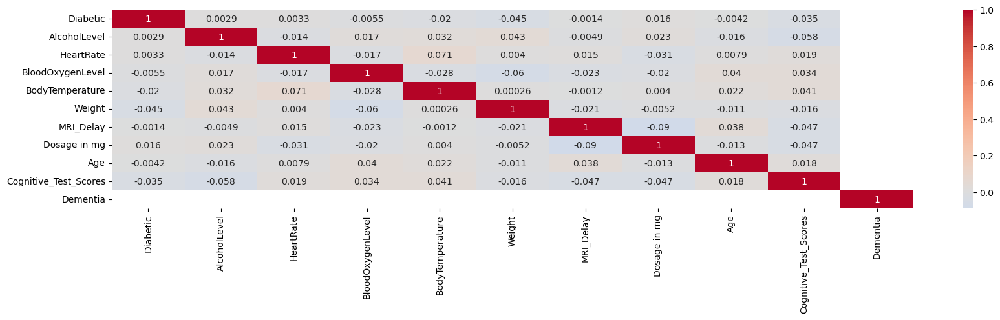

In [640]:
corrs = only_sick.corr(method = 'kendall', numeric_only=True)
plt.figure(figsize=(20,4))  #figure size
sns.heatmap(corrs, cmap='coolwarm', center=0, annot = True)

<Axes: xlabel='Age', ylabel='Probability'>

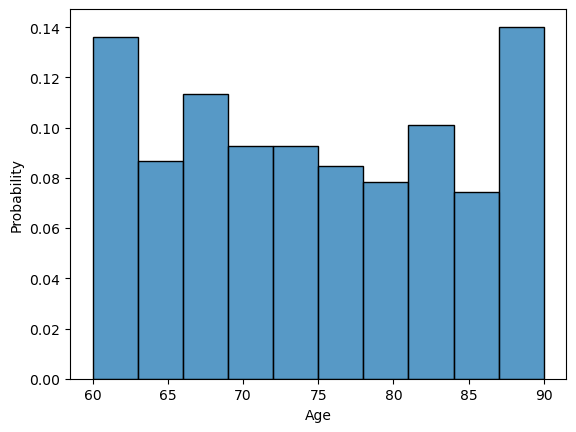

In [641]:
sns.histplot(data=only_sick,x= "Age",stat='probability')

<Axes: xlabel='Age', ylabel='Probability'>

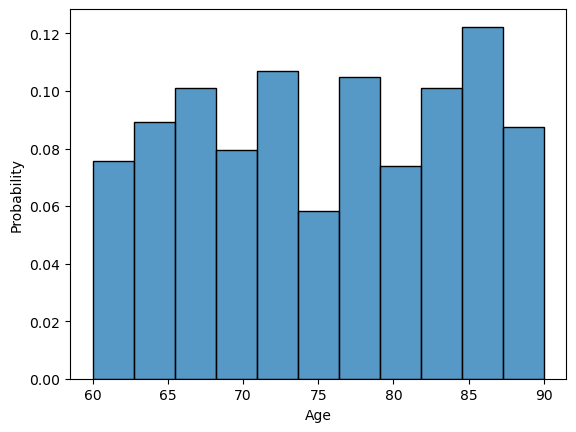

In [642]:
sns.histplot(data=not_sick,x= "Age",stat='probability')

<Axes: ylabel='Age'>

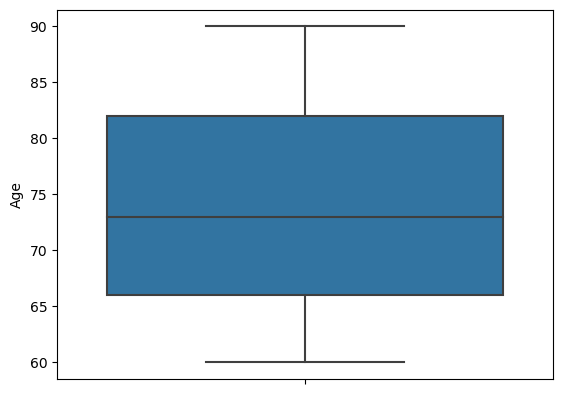

In [643]:
sns.boxplot(data=only_sick,y= "Age")


In [644]:
dmn_df.columns

Index(['Diabetic', 'AlcoholLevel', 'HeartRate', 'BloodOxygenLevel',
       'BodyTemperature', 'Weight', 'MRI_Delay', 'Prescription',
       'Dosage in mg', 'Age', 'Education_Level', 'Dominant_Hand', 'Gender',
       'Family_History', 'Smoking_Status', 'APOE_ε4', 'Physical_Activity',
       'Depression_Status', 'Cognitive_Test_Scores', 'Medication_History',
       'Nutrition_Diet', 'Sleep_Quality', 'Chronic_Health_Conditions',
       'Dementia'],
      dtype='object')

<Axes: xlabel='Dementia', ylabel='AlcoholLevel'>

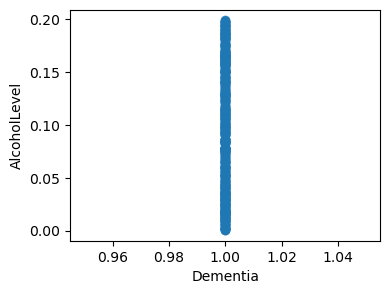

In [645]:
plt.figure(figsize=(4,3))
sns.regplot(x='Dementia', y='AlcoholLevel', data=only_sick)

In [646]:
dmn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 24 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Diabetic                   1000 non-null   int64  
 1   AlcoholLevel               1000 non-null   float64
 2   HeartRate                  1000 non-null   int64  
 3   BloodOxygenLevel           1000 non-null   float64
 4   BodyTemperature            1000 non-null   float64
 5   Weight                     1000 non-null   float64
 6   MRI_Delay                  1000 non-null   float64
 7   Prescription               485 non-null    object 
 8   Dosage in mg               485 non-null    float64
 9   Age                        1000 non-null   int64  
 10  Education_Level            1000 non-null   object 
 11  Dominant_Hand              1000 non-null   object 
 12  Gender                     1000 non-null   object 
 13  Family_History             1000 non-null   object

In [647]:
display(only_sick.describe().round(3).T) # numerical

,count,mean,std,min,25%,50%,75%,max
Diabetic,485.0,0.536,0.499,0.000,0.000,1.000,1.000,1.000
AlcoholLevel,485.0,0.098,0.059,0.000,0.043,0.098,0.153,0.199
HeartRate,485.0,79.536,12.128,60.000,69.000,80.000,90.000,100.000
BloodOxygenLevel,485.0,95.010,2.886,90.011,92.601,95.053,97.535,99.995
BodyTemperature,485.0,36.777,0.424,36.003,36.447,36.820,37.109,37.497
Weight,485.0,73.583,15.027,50.070,59.522,73.427,87.070,99.983
MRI_Delay,485.0,30.646,16.866,0.236,17.142,30.662,44.231,59.952
Dosage in mg,485.0,9.213,6.493,1.500,4.000,8.000,12.000,23.000
Age,485.0,74.326,9.340,60.000,66.000,73.000,82.000,90.000
Cognitive_Test_Scores,485.0,3.621,2.311,0.000,2.000,4.000,6.000,7.000


In [648]:
display(NO_SICK.describe().round(3).T) # numerical

,count,mean,std,min,25%,50%,75%,max
Diabetic,515.0,0.491,0.500,0.000,0.000,0.000,1.000,1.000
AlcoholLevel,515.0,0.099,0.058,0.001,0.047,0.098,0.151,0.200
HeartRate,515.0,79.239,12.099,60.000,68.000,79.000,90.000,100.000
BloodOxygenLevel,515.0,95.429,2.958,90.020,93.068,95.717,97.910,99.999
BodyTemperature,515.0,36.747,0.439,36.002,36.351,36.759,37.143,37.489
Weight,515.0,75.017,13.891,50.074,63.342,74.830,86.510,99.825
MRI_Delay,515.0,29.592,16.859,0.095,14.768,28.808,43.990,59.958
Dosage in mg,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Age,515.0,75.456,8.832,60.000,68.000,76.000,83.000,90.000
Cognitive_Test_Scores,515.0,8.984,0.808,8.000,8.000,9.000,10.000,10.000


In [649]:
display(only_sick.describe(include = ['object', 'bool', 'category']).T)
display(NO_SICK.describe(include = ['object', 'bool', 'category']).T)

,count,unique,top,freq
Prescription,485,4,Memantine,128
Education_Level,485,4,Primary School,181
Dominant_Hand,485,2,Left,251
Gender,485,2,Female,244
Family_History,485,2,No,255
Smoking_Status,485,2,Former Smoker,252
APOE_ε4,485,2,Positive,435
Physical_Activity,485,3,Mild Activity,169
Depression_Status,485,2,Yes,245
Medication_History,485,2,Yes,251


,count,unique,top,freq
Prescription,0,0,NaN,NaN
Education_Level,515,4,Primary School,208
Dominant_Hand,515,2,Left,268
Gender,515,2,Female,260
Family_History,515,2,Yes,290
Smoking_Status,515,3,Never Smoked,219
APOE_ε4,515,2,Positive,259
Physical_Activity,515,3,Mild Activity,182
Depression_Status,515,1,No,515
Medication_History,515,2,Yes,263


 Does the higher the cognitive tests score, the lower the probability of dementia?


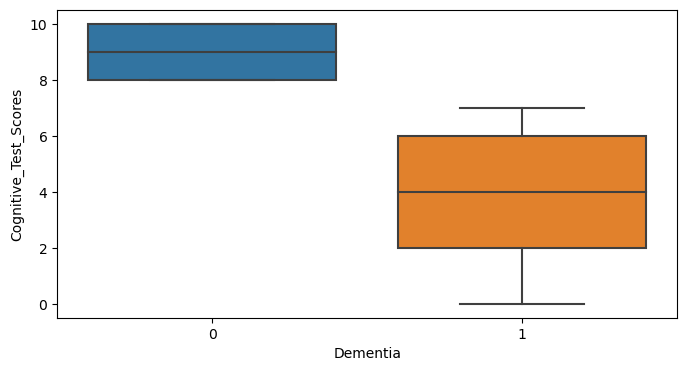

In [650]:
plt.figure(figsize = (8, 4), facecolor = "white")

sns.boxplot(data = data, x = 'Dementia', y = 'Cognitive_Test_Scores')

plt.show()


In [651]:
ohe=OneHotEncoder()
ohe.fit_transform(dmn_df[["Sleep_Quality","Depression_Status","Education_Level"]]).toarray()


array([[0., 1., 1., ..., 0., 1., 0.],
       [0., 1., 1., ..., 0., 0., 1.],
       [0., 1., 1., ..., 0., 1., 0.],
       ...,
       [1., 0., 1., ..., 0., 1., 0.],
       [1., 0., 0., ..., 1., 0., 0.],
       [1., 0., 1., ..., 0., 0., 1.]])

In [652]:
dmn_df

,Diabetic,AlcoholLevel,HeartRate,BloodOxygenLevel,BodyTemperature,Weight,MRI_Delay,Prescription,Dosage in mg,Age,...,Smoking_Status,APOE_ε4,Physical_Activity,Depression_Status,Cognitive_Test_Scores,Medication_History,Nutrition_Diet,Sleep_Quality,Chronic_Health_Conditions,Dementia
0,1,0.084974,98,96.230743,36.224852,57.563978,36.421028,NaN,NaN,60,...,Current Smoker,Negative,Sedentary,No,10,No,Low-Carb Diet,Poor,Diabetes,0
1,0,0.016973,78,93.032122,36.183874,56.832335,31.157633,Galantamine,12.0,61,...,Former Smoker,Positive,Moderate Activity,No,1,Yes,Low-Carb Diet,Poor,Heart Disease,1
2,0,0.009000,89,93.566504,37.326321,59.759066,37.640435,NaN,NaN,69,...,Former Smoker,Negative,Moderate Activity,No,8,No,Mediterranean Diet,Poor,Heart Disease,0
3,0,0.086437,60,93.906510,37.030620,58.266471,50.673992,Donepezil,23.0,78,...,Never Smoked,Negative,Mild Activity,Yes,5,Yes,Balanced Diet,Poor,Hypertension,1
4,1,0.150747,67,97.508994,36.062121,67.705027,27.810601,Memantine,20.0,77,...,Never Smoked,Positive,Mild Activity,No,0,Yes,Low-Carb Diet,Good,Diabetes,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1,0.081825,87,93.851963,36.495134,50.380106,42.318663,Donepezil,10.0,88,...,Never Smoked,Positive,Mild Activity,No,5,No,Balanced Diet,Poor,Diabetes,1
996,1,0.145249,97,94.522391,36.270804,94.006484,52.812568,NaN,NaN,80,...,Never Smoked,Negative,Moderate Activity,No,9,Yes,Low-Carb Diet,Poor,Diabetes,0
997,1,0.073692,65,98.578388,37.065703,80.088613,13.640229,NaN,NaN,67,...,Never Smoked,Positive,Sedentary,No,8,Yes,Balanced Diet,Good,Diabetes,0
998,0,0.037347,71,91.298580,37.037202,95.322210,17.445715,Memantine,20.0,62,...,Never Smoked,Positive,Sedentary,Yes,2,No,Low-Carb Diet,Good,NaN,1


In [653]:
ohe.categories_

[array(['Good', 'Poor'], dtype=object),
 array(['No', 'Yes'], dtype=object),
 array(['Diploma/Degree', 'No School', 'Primary School',
        'Secondary School'], dtype=object)]

In [654]:
feature_labels=ohe.categories_
print(feature_labels)

[array(['Good', 'Poor'], dtype=object), array(['No', 'Yes'], dtype=object), array(['Diploma/Degree', 'No School', 'Primary School',
       'Secondary School'], dtype=object)]


In [655]:
np.array([label for sublist in feature_labels for label in sublist])

array(['Good', 'Poor', 'No', 'Yes', 'Diploma/Degree', 'No School',
       'Primary School', 'Secondary School'], dtype='<U16')

In [656]:
features=pd.DataFrame(features.arry,columns=feature_labels)

AttributeError: 'DataFrame' object has no attribute 'arry'

In [657]:
features.head()

,Good,Poor
0,Good,Poor


In [658]:
#data.concat([data,featurws],axis=1)

In [659]:
dmn_df['Prescription'].replace(np.nan, "No medication was prescribed", inplace=True)
dmn_df['Dosage in mg'].replace(np.nan, 0, inplace=True)
dmn_df['Chronic_Health_Conditions'].replace(np.nan, "Not diagnosed with chronic illness", inplace=True)
dmn_df

,Diabetic,AlcoholLevel,HeartRate,BloodOxygenLevel,BodyTemperature,Weight,MRI_Delay,Prescription,Dosage in mg,Age,...,Smoking_Status,APOE_ε4,Physical_Activity,Depression_Status,Cognitive_Test_Scores,Medication_History,Nutrition_Diet,Sleep_Quality,Chronic_Health_Conditions,Dementia
0,1,0.084974,98,96.230743,36.224852,57.563978,36.421028,No medication was prescribed,0.0,60,...,Current Smoker,Negative,Sedentary,No,10,No,Low-Carb Diet,Poor,Diabetes,0
1,0,0.016973,78,93.032122,36.183874,56.832335,31.157633,Galantamine,12.0,61,...,Former Smoker,Positive,Moderate Activity,No,1,Yes,Low-Carb Diet,Poor,Heart Disease,1
2,0,0.009000,89,93.566504,37.326321,59.759066,37.640435,No medication was prescribed,0.0,69,...,Former Smoker,Negative,Moderate Activity,No,8,No,Mediterranean Diet,Poor,Heart Disease,0
3,0,0.086437,60,93.906510,37.030620,58.266471,50.673992,Donepezil,23.0,78,...,Never Smoked,Negative,Mild Activity,Yes,5,Yes,Balanced Diet,Poor,Hypertension,1
4,1,0.150747,67,97.508994,36.062121,67.705027,27.810601,Memantine,20.0,77,...,Never Smoked,Positive,Mild Activity,No,0,Yes,Low-Carb Diet,Good,Diabetes,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1,0.081825,87,93.851963,36.495134,50.380106,42.318663,Donepezil,10.0,88,...,Never Smoked,Positive,Mild Activity,No,5,No,Balanced Diet,Poor,Diabetes,1
996,1,0.145249,97,94.522391,36.270804,94.006484,52.812568,No medication was prescribed,0.0,80,...,Never Smoked,Negative,Moderate Activity,No,9,Yes,Low-Carb Diet,Poor,Diabetes,0
997,1,0.073692,65,98.578388,37.065703,80.088613,13.640229,No medication was prescribed,0.0,67,...,Never Smoked,Positive,Sedentary,No,8,Yes,Balanced Diet,Good,Diabetes,0
998,0,0.037347,71,91.298580,37.037202,95.322210,17.445715,Memantine,20.0,62,...,Never Smoked,Positive,Sedentary,Yes,2,No,Low-Carb Diet,Good,Not diagnosed with chronic illness,1


In [660]:
dmn_df[["APOE_ε4"]]

,APOE_ε4
0,Negative
1,Positive
2,Negative
3,Negative
4,Positive
...,...
995,Positive
996,Negative
997,Positive
998,Positive


In [661]:
dmn_df_dummies = pd.get_dummies(dmn_df)
#dmn_df_dummies.replace("False",0)
#dmn_df_dummies.replace("True",0)
dmn_df_dummies

,Diabetic,AlcoholLevel,HeartRate,BloodOxygenLevel,BodyTemperature,Weight,MRI_Delay,Dosage in mg,Age,Cognitive_Test_Scores,...,Medication_History_Yes,Nutrition_Diet_Balanced Diet,Nutrition_Diet_Low-Carb Diet,Nutrition_Diet_Mediterranean Diet,Sleep_Quality_Good,Sleep_Quality_Poor,Chronic_Health_Conditions_Diabetes,Chronic_Health_Conditions_Heart Disease,Chronic_Health_Conditions_Hypertension,Chronic_Health_Conditions_Not diagnosed with chronic illness
0,1,0.084974,98,96.230743,36.224852,57.563978,36.421028,0.0,60,10,...,False,False,True,False,False,True,True,False,False,False
1,0,0.016973,78,93.032122,36.183874,56.832335,31.157633,12.0,61,1,...,True,False,True,False,False,True,False,True,False,False
2,0,0.009000,89,93.566504,37.326321,59.759066,37.640435,0.0,69,8,...,False,False,False,True,False,True,False,True,False,False
3,0,0.086437,60,93.906510,37.030620,58.266471,50.673992,23.0,78,5,...,True,True,False,False,False,True,False,False,True,False
4,1,0.150747,67,97.508994,36.062121,67.705027,27.810601,20.0,77,0,...,True,False,True,False,True,False,True,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1,0.081825,87,93.851963,36.495134,50.380106,42.318663,10.0,88,5,...,False,True,False,False,False,True,True,False,False,False
996,1,0.145249,97,94.522391,36.270804,94.006484,52.812568,0.0,80,9,...,True,False,True,False,False,True,True,False,False,False
997,1,0.073692,65,98.578388,37.065703,80.088613,13.640229,0.0,67,8,...,True,True,False,False,True,False,True,False,False,False
998,0,0.037347,71,91.298580,37.037202,95.322210,17.445715,20.0,62,2,...,False,False,True,False,True,False,False,False,False,True


In [662]:
dmn_with_corr=dmn_df_dummies.corr()
dmn_with_corr

,Diabetic,AlcoholLevel,HeartRate,BloodOxygenLevel,BodyTemperature,Weight,MRI_Delay,Dosage in mg,Age,Cognitive_Test_Scores,...,Medication_History_Yes,Nutrition_Diet_Balanced Diet,Nutrition_Diet_Low-Carb Diet,Nutrition_Diet_Mediterranean Diet,Sleep_Quality_Good,Sleep_Quality_Poor,Chronic_Health_Conditions_Diabetes,Chronic_Health_Conditions_Heart Disease,Chronic_Health_Conditions_Hypertension,Chronic_Health_Conditions_Not diagnosed with chronic illness
Diabetic,1.000000,-0.025616,-0.007188,-0.016575,-0.053851,-0.007501,-0.020378,0.049210,0.000923,-0.050019,...,-0.006733,-0.009839,0.003021,0.006793,0.055916,-0.055916,1.000000,-0.439574,-0.436213,-0.479236
AlcoholLevel,-0.025616,1.000000,-0.046341,-0.005562,0.030854,0.034553,0.004160,0.008300,-0.003081,-0.018716,...,-0.058951,-0.013902,0.032151,-0.018119,-0.033801,0.033801,-0.025616,-0.055492,0.002164,0.083755
HeartRate,-0.007188,-0.046341,1.000000,0.022283,0.015585,-0.001730,0.000169,-0.020054,0.011665,0.005493,...,0.027799,-0.001782,-0.083193,0.084472,-0.003392,0.003392,-0.007188,-0.020177,0.036131,-0.005509
BloodOxygenLevel,-0.016575,-0.005562,0.022283,1.000000,-0.007265,-0.041081,-0.005760,-0.062321,0.029565,0.070218,...,0.015129,-0.000840,-0.014534,0.015284,-0.017862,0.017862,-0.016575,-0.013011,0.013205,0.021495
BodyTemperature,-0.053851,0.030854,0.015585,-0.007265,1.000000,-0.017750,0.015953,0.045258,0.001586,-0.009791,...,0.022006,0.015300,0.023253,-0.038347,-0.011410,0.011410,-0.053851,0.030771,-0.007905,0.048587
Weight,-0.007501,0.034553,-0.001730,-0.041081,-0.017750,1.000000,-0.022890,-0.029248,0.011739,0.035821,...,-0.057993,-0.020632,-0.000085,0.020625,-0.005504,0.005504,-0.007501,-0.007676,0.031411,-0.012469
MRI_Delay,-0.020378,0.004160,0.000169,-0.005760,0.015953,-0.022890,1.000000,-0.035924,-0.002093,-0.052227,...,0.038864,0.008633,-0.013200,0.004527,-0.002877,0.002877,-0.020378,0.074871,-0.022546,-0.022941
Dosage in mg,0.049210,0.008300,-0.020054,-0.062321,0.045258,-0.029248,-0.035924,1.000000,-0.050452,-0.619073,...,-0.024600,-0.021741,0.021725,0.000048,-0.015638,0.015638,0.049210,-0.048884,-0.010629,-0.008032
Age,0.000923,-0.003081,0.011665,0.029565,0.001586,0.011739,-0.002093,-0.050452,1.000000,0.062640,...,-0.050559,-0.071585,-0.005764,0.076998,-0.003336,0.003336,0.000923,-0.008128,-0.042758,0.046621
Cognitive_Test_Scores,-0.050019,-0.018716,0.005493,0.070218,-0.009791,0.035821,-0.052227,-0.619073,0.062640,1.000000,...,0.013304,0.037301,-0.016316,-0.020917,0.004113,-0.004113,-0.050019,0.046618,0.015205,0.006928


<Axes: >

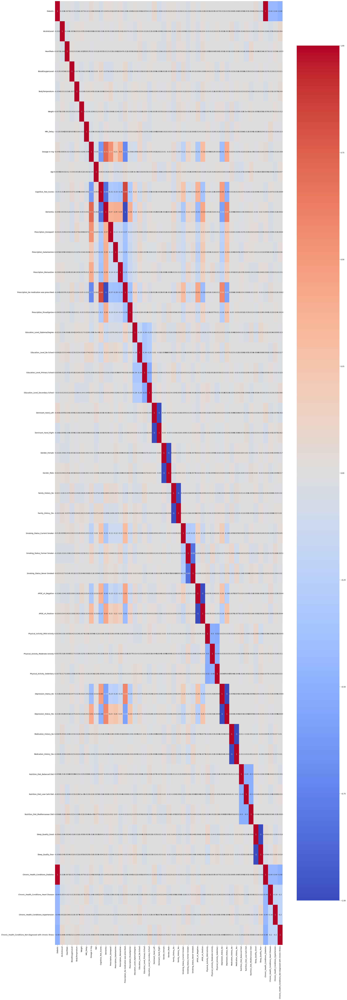

In [663]:
plt.figure(figsize=(30,100))  #figure size
sns.heatmap(dmn_with_corr, cmap='coolwarm', center=0, annot = True)

<Axes: >

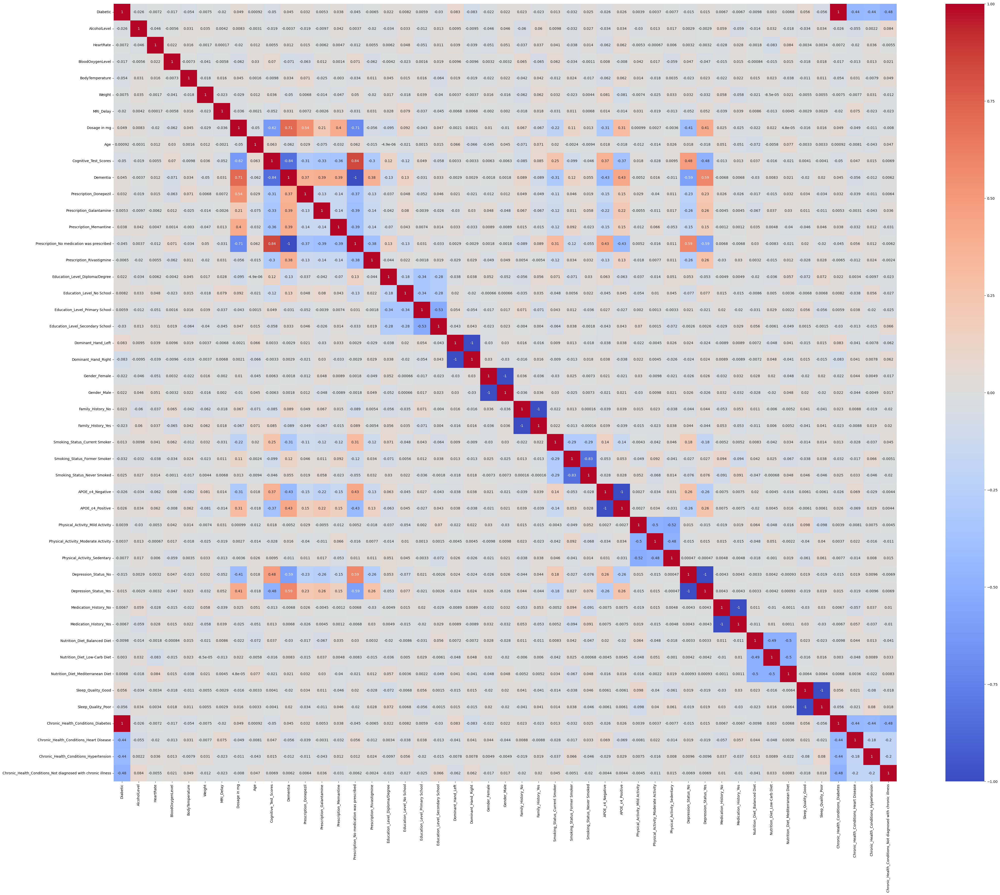

In [664]:
plt.figure(figsize=(50,40))
sns.heatmap(dmn_with_corr, cmap= 'coolwarm', center= 0, annot = True)

<module 'matplotlib.pyplot' from 'C:\\Users\\shira\\anaconda3\\Lib\\site-packages\\matplotlib\\pyplot.py'>

<Figure size 7000x7000 with 0 Axes>

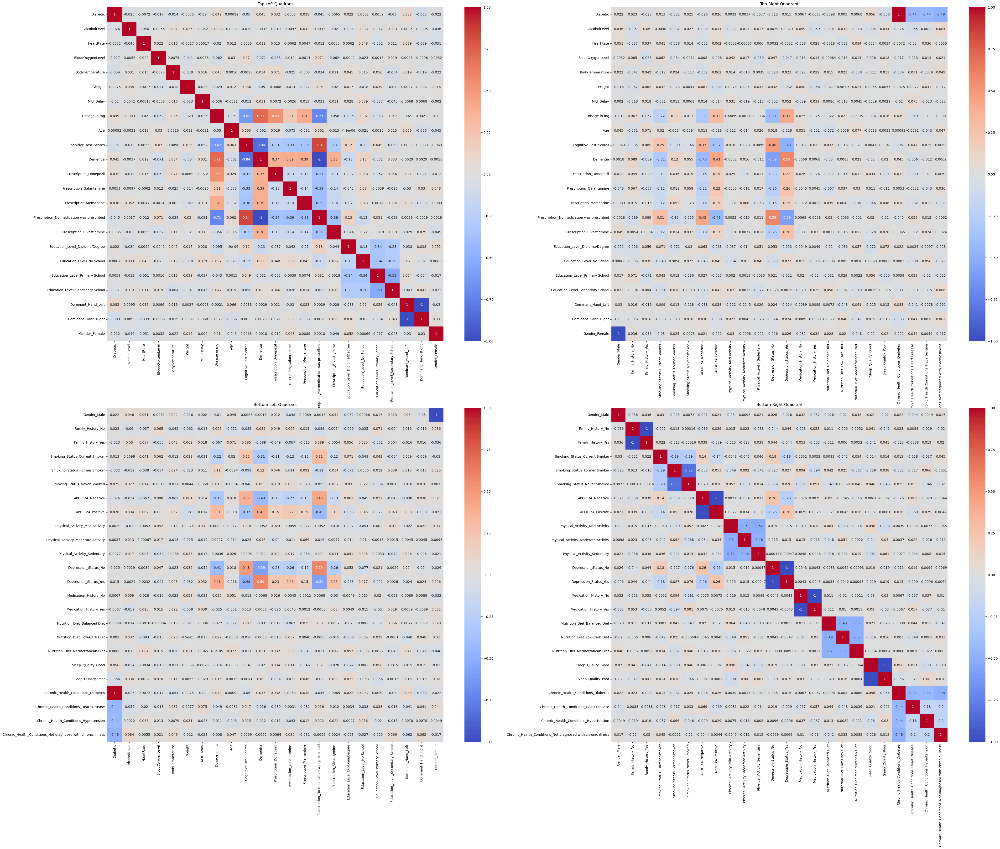

In [665]:
plt.figure(figsize=(70, 70))

fig, axes = plt.subplots(2, 2, figsize=(50, 40))

sns.heatmap(dmn_with_corr.iloc[:23, :23], cmap='coolwarm', center=0, annot=True, ax=axes[0, 0])
sns.heatmap(dmn_with_corr.iloc[:23, 23:], cmap='coolwarm', center=0, annot=True, ax=axes[0, 1])
sns.heatmap(dmn_with_corr.iloc[23:, :23], cmap='coolwarm', center=0, annot=True, ax=axes[1, 0])
sns.heatmap(dmn_with_corr.iloc[23:, 23:], cmap='coolwarm', center=0, annot=True, ax=axes[1, 1])

axes[0, 0].set_title('Top Left Quadrant')
axes[0, 1].set_title('Top Right Quadrant')
axes[1, 0].set_title('Bottom Left Quadrant')
axes[1, 1].set_title('Bottom Right Quadrant')

#plt.tight_layout()
plt

<Axes: >

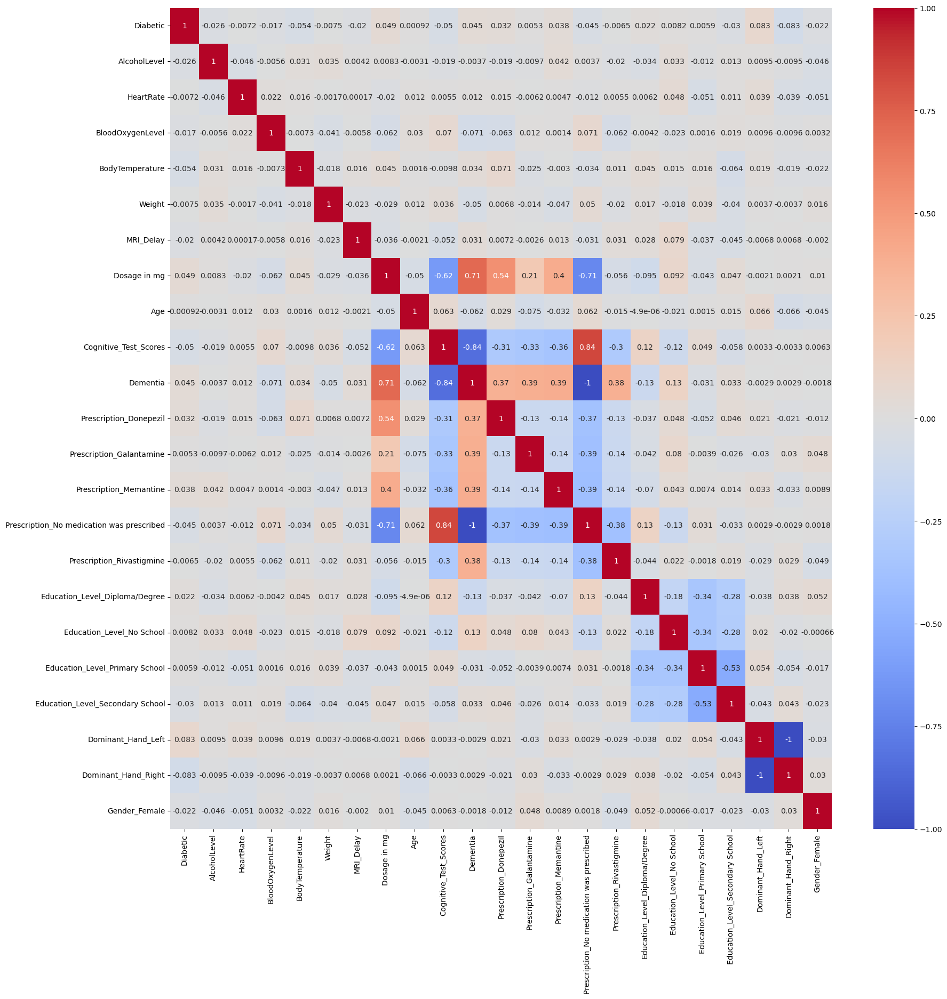

In [666]:
plt.figure(figsize=(20, 20))
sns.heatmap(dmn_with_corr.iloc[:23, :23], cmap='coolwarm', center=0, annot=True)

In [667]:
dmn_with_corr.shape

(47, 47)

<Axes: >

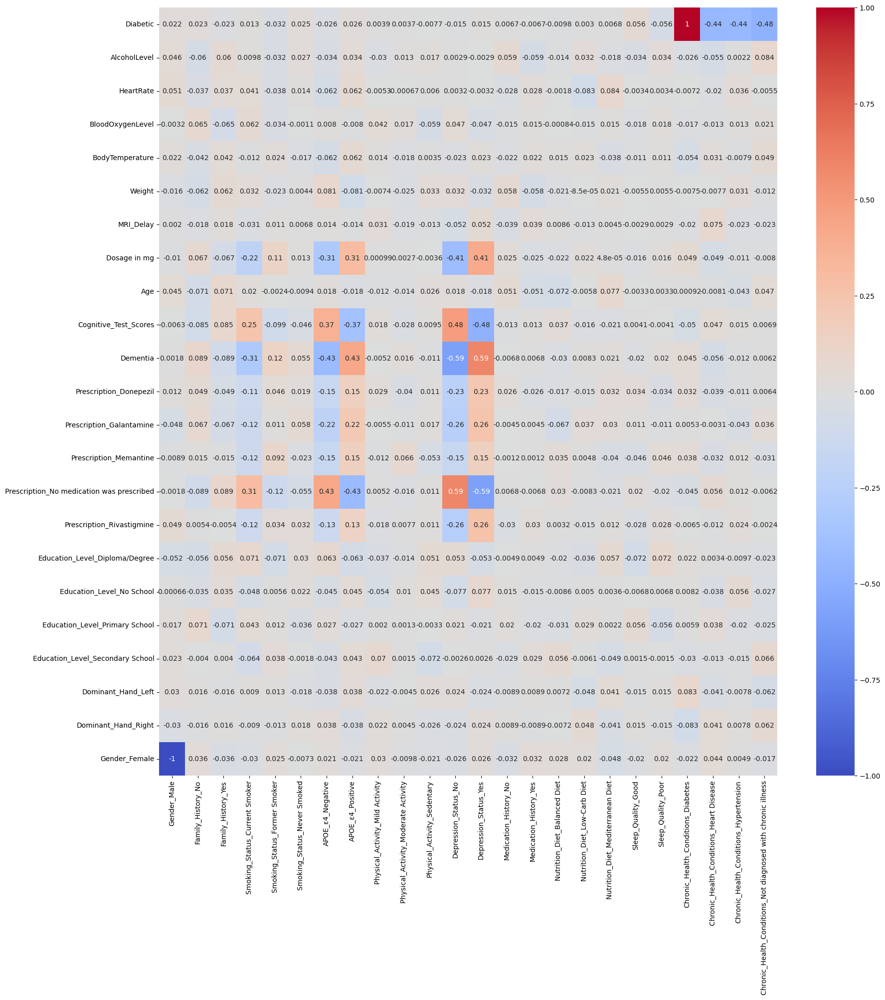

In [687]:
plt.figure(figsize=(20, 20))
sns.heatmap(dmn_with_corr.iloc[:23, 23:], cmap='coolwarm', center=0, annot=True)

<Axes: >

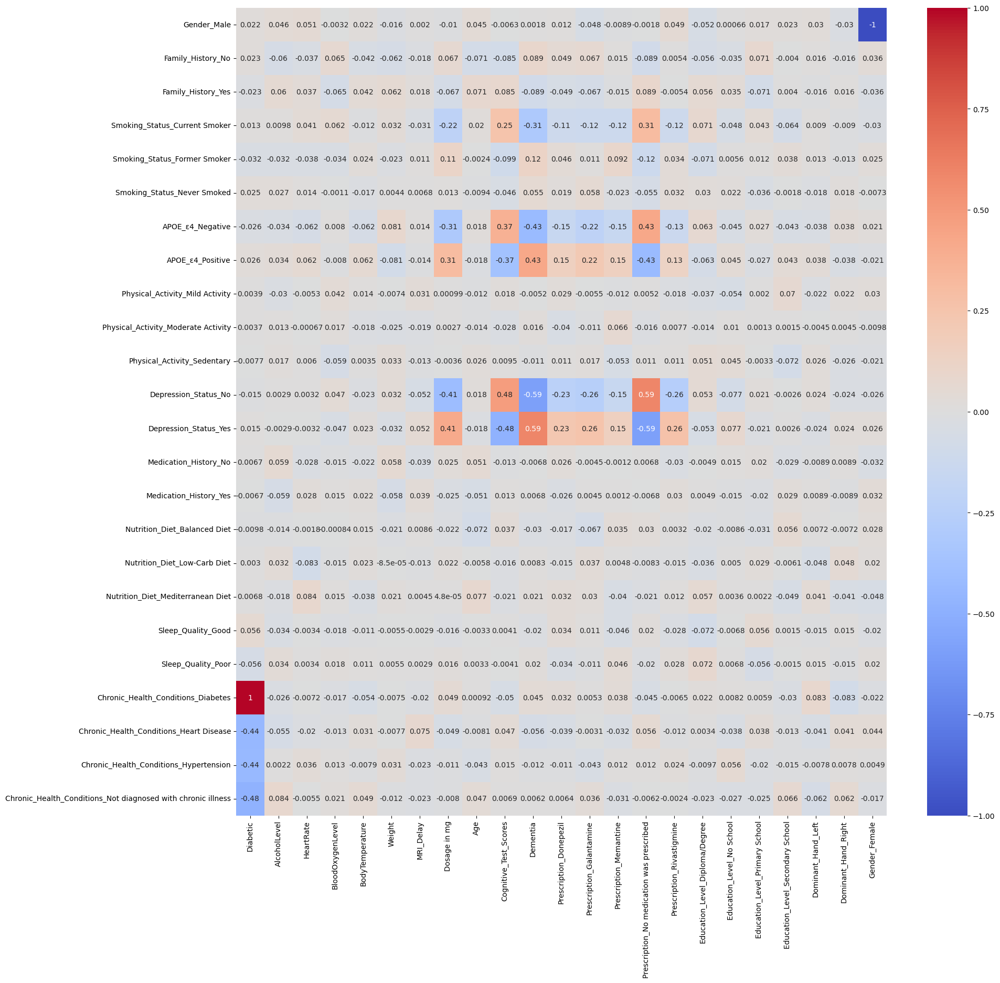

In [669]:
plt.figure(figsize=(20, 20))
sns.heatmap(corr.iloc[23:, :23], cmap='coolwarm', center=0, annot=True, ax=axes[1, 0])

<Axes: >

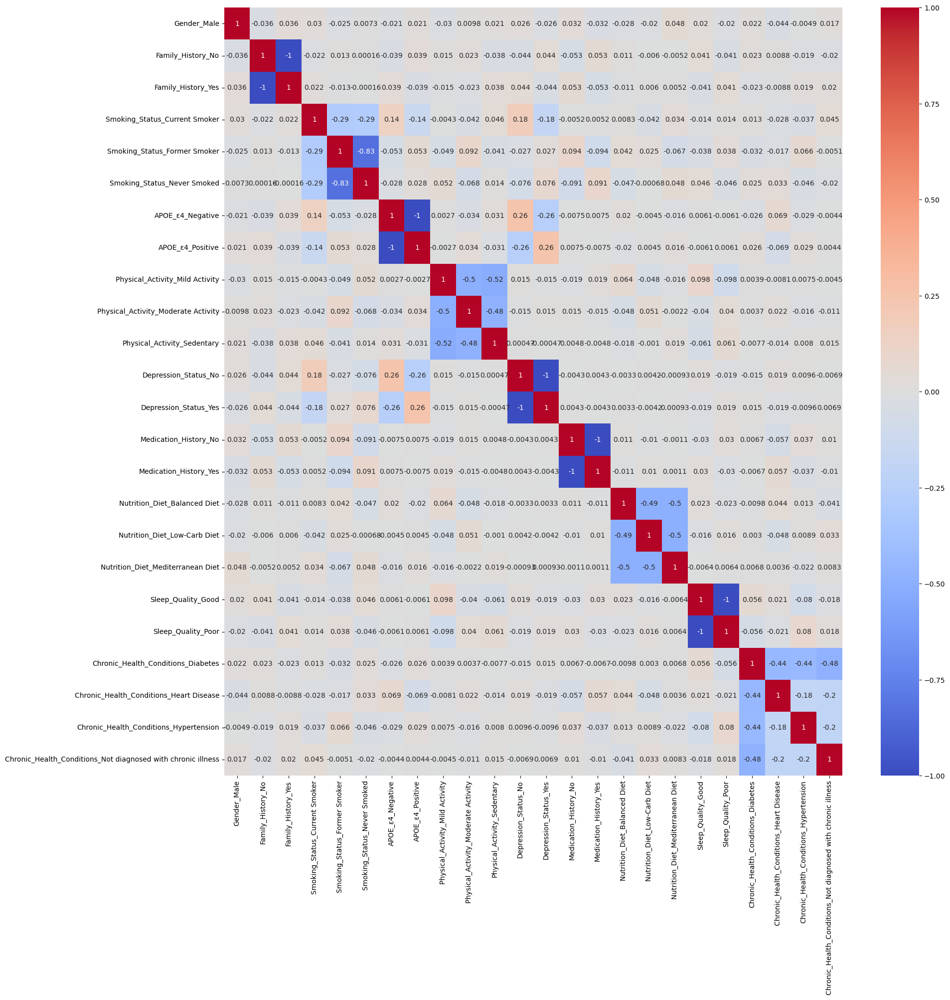

In [670]:
plt.figure(figsize=(20, 20))
sns.heatmap(dmn_with_corr.iloc[23:, 23:], cmap='coolwarm', center=0, annot=True)

In [671]:
dmn_df.columns

Index(['Diabetic', 'AlcoholLevel', 'HeartRate', 'BloodOxygenLevel',
       'BodyTemperature', 'Weight', 'MRI_Delay', 'Prescription',
       'Dosage in mg', 'Age', 'Education_Level', 'Dominant_Hand', 'Gender',
       'Family_History', 'Smoking_Status', 'APOE_ε4', 'Physical_Activity',
       'Depression_Status', 'Cognitive_Test_Scores', 'Medication_History',
       'Nutrition_Diet', 'Sleep_Quality', 'Chronic_Health_Conditions',
       'Dementia'],
      dtype='object')

In [672]:
dmn_df["Chronic_Health_Conditions"].unique()

array(['Diabetes', 'Heart Disease', 'Hypertension',
       'Not diagnosed with chronic illness'], dtype=object)

In [673]:
skinnest=dmn_df["Weight"].min()
fatest=dmn_df["Weight"].max()
skinnest,fatest

(50.06973074, 99.98272209)

<Axes: >

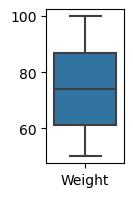

In [674]:
plt.figure(figsize=(1,2))
sns.boxplot(data = dmn_df[['Weight' ]])

<Axes: >

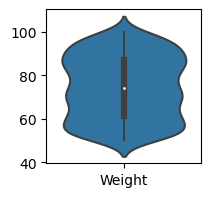

In [675]:
plt.figure(figsize=(2,2))
sns.violinplot(data = dmn_df[['Weight' ]])

<Axes: ylabel='Count'>

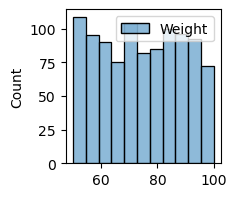

In [676]:
plt.figure(figsize=(2,2))
sns.histplot(data = dmn_df[['Weight' ]])

#לפצל משקל ל3

<Axes: xlabel='Chronic_Health_Conditions', ylabel='count'>

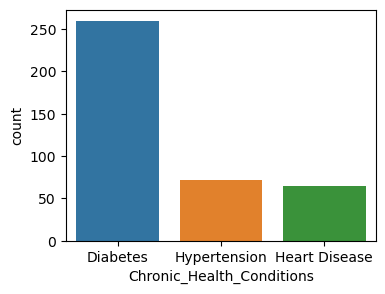

In [677]:
plt.figure(figsize=(4, 3))

# חולים - מיון סוגי מחלות
sns.countplot(x='Chronic_Health_Conditions', data=only_sick, order=only_sick['Chronic_Health_Conditions'].value_counts().index)

<Axes: xlabel='Chronic_Health_Conditions', ylabel='count'>

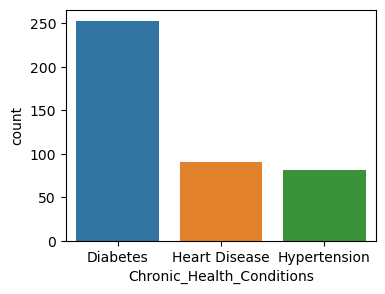

In [682]:
plt.figure(figsize=(4, 3))

# חולים - מיון סוגי מחלות
sns.countplot(x='Chronic_Health_Conditions', data=not_sick , order=not_sick['Chronic_Health_Conditions'].value_counts().index)

<Axes: xlabel='Chronic_Health_Conditions', ylabel='count'>

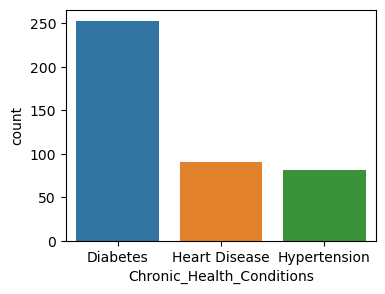

In [683]:
plt.figure(figsize=(4, 3))

# חולים - מיון סוגי מחלות
sns.countplot(x='Chronic_Health_Conditions', data=not_sick )

In [688]:
dmn_df.dtypes

Diabetic                       int64
AlcoholLevel                 float64
HeartRate                      int64
BloodOxygenLevel             float64
BodyTemperature              float64
Weight                       float64
MRI_Delay                    float64
Prescription                  object
Dosage in mg                 float64
Age                            int64
Education_Level               object
Dominant_Hand                 object
Gender                        object
Family_History                object
Smoking_Status                object
APOE_ε4                       object
Physical_Activity             object
Depression_Status             object
Cognitive_Test_Scores          int64
Medication_History            object
Nutrition_Diet                object
Sleep_Quality                 object
Chronic_Health_Conditions     object
Dementia                       int64
dtype: object

In [689]:
dmn_with_corr.dtypes

Diabetic                                                        float64
AlcoholLevel                                                    float64
HeartRate                                                       float64
BloodOxygenLevel                                                float64
BodyTemperature                                                 float64
Weight                                                          float64
MRI_Delay                                                       float64
Dosage in mg                                                    float64
Age                                                             float64
Cognitive_Test_Scores                                           float64
Dementia                                                        float64
Prescription_Donepezil                                          float64
Prescription_Galantamine                                        float64
Prescription_Memantine                                          

In [695]:
dmn_df.columns

Index(['Diabetic', 'AlcoholLevel', 'HeartRate', 'BloodOxygenLevel',
       'BodyTemperature', 'Weight', 'MRI_Delay', 'Prescription',
       'Dosage in mg', 'Age', 'Education_Level', 'Dominant_Hand', 'Gender',
       'Family_History', 'Smoking_Status', 'APOE_ε4', 'Physical_Activity',
       'Depression_Status', 'Cognitive_Test_Scores', 'Medication_History',
       'Nutrition_Diet', 'Sleep_Quality', 'Chronic_Health_Conditions',
       'Dementia'],
      dtype='object')

In [700]:
dmn_df["AlcoholLevel"].unique()
#להצליב עם הגן ועם הרמות השכלה להוסיף עוד פרמטר אם מוצאים הקבלה
# לבנות היסטוגרמה ולראות מינימום מקסימום וממוצע ולפי זה לחלק לקבוצות

array([0.08497363, 0.01697277, 0.00900025, 0.08643726, 0.15074731,
       0.1140278 , 0.01619378, 0.16115808, 0.01575425, 0.09733954,
       0.06748564, 0.08267123, 0.02807717, 0.08805155, 0.15656361,
       0.1659716 , 0.03567131, 0.02930638, 0.15908456, 0.19710716,
       0.09234223, 0.08905676, 0.04706498, 0.0022444 , 0.1559942 ,
       0.1055605 , 0.10967133, 0.05261273, 0.1413211 , 0.14555626,
       0.01621965, 0.06240634, 0.1894373 , 0.16636984, 0.13061763,
       0.15008774, 0.08112397, 0.1656683 , 0.09992415, 0.04157571,
       0.10991138, 0.05445505, 0.14617384, 0.19078454, 0.04034117,
       0.07321483, 0.14017791, 0.0227364 , 0.04778358, 0.08807547,
       0.02556337, 0.18617617, 0.04906598, 0.0979699 , 0.10318646,
       0.10808652, 0.16685116, 0.1303138 , 0.15566145, 0.14444342,
       0.04741042, 0.00132653, 0.17627566, 0.03855862, 0.0289448 ,
       0.05047045, 0.07885336, 0.10065803, 0.12261174, 0.12878761,
       0.14539247, 0.12008087, 0.10553423, 0.1484994 , 0.14102

<Axes: >

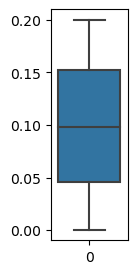

In [705]:
plt.figure(figsize=(1,4))
sns.boxplot(data=dmn_df["AlcoholLevel"])
## ראינו מה ההתפלגות של הרמות אלכוהול והבנו שצריך לחלק ל3 קבוצות כי כולם יחסים מרוכזים

<Axes: xlabel='AlcoholLevel', ylabel='Count'>

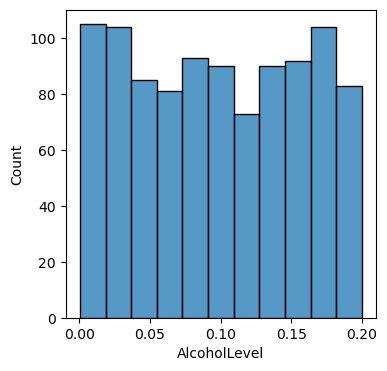

In [726]:
plt.figure(figsize=(4,4))
sns.histplot(data=dmn_df["AlcoholLevel"])

In [714]:
max(dmn_df["AlcoholLevel"])

0.199866365

In [715]:
min(dmn_df["AlcoholLevel"])

0.000413762

In [719]:
alcohol_cuts = pd.qcut(dmn_df["AlcoholLevel"], 3, retbins=True)[1]
alcohol_cuts

array([0.00041376, 0.06311411, 0.13294815, 0.19986636])

In [720]:

dmn_df['AlcoholLevelGroup'] = pd.cut(dmn_df["AlcoholLevel"], bins=alcohol_cuts, labels=["Low", "Medium", "High"])

dmn_df.head()

,Diabetic,AlcoholLevel,HeartRate,BloodOxygenLevel,BodyTemperature,Weight,MRI_Delay,Prescription,Dosage in mg,Age,...,APOE_ε4,Physical_Activity,Depression_Status,Cognitive_Test_Scores,Medication_History,Nutrition_Diet,Sleep_Quality,Chronic_Health_Conditions,Dementia,AlcoholLevelGroup
0,1,0.084974,98,96.230743,36.224852,57.563978,36.421028,No medication was prescribed,0.0,60,...,Negative,Sedentary,No,10,No,Low-Carb Diet,Poor,Diabetes,0,Medium
1,0,0.016973,78,93.032122,36.183874,56.832335,31.157633,Galantamine,12.0,61,...,Positive,Moderate Activity,No,1,Yes,Low-Carb Diet,Poor,Heart Disease,1,Low
2,0,0.009000,89,93.566504,37.326321,59.759066,37.640435,No medication was prescribed,0.0,69,...,Negative,Moderate Activity,No,8,No,Mediterranean Diet,Poor,Heart Disease,0,Low
3,0,0.086437,60,93.906510,37.030620,58.266471,50.673992,Donepezil,23.0,78,...,Negative,Mild Activity,Yes,5,Yes,Balanced Diet,Poor,Hypertension,1,Medium
4,1,0.150747,67,97.508994,36.062121,67.705027,27.810601,Memantine,20.0,77,...,Positive,Mild Activity,No,0,Yes,Low-Carb Diet,Good,Diabetes,1,High


In [728]:
dmn_df_dummies2 = pd.get_dummies(dmn_df)
dmn_df_dummies2

,Diabetic,AlcoholLevel,HeartRate,BloodOxygenLevel,BodyTemperature,Weight,MRI_Delay,Dosage in mg,Age,Cognitive_Test_Scores,...,Nutrition_Diet_Mediterranean Diet,Sleep_Quality_Good,Sleep_Quality_Poor,Chronic_Health_Conditions_Diabetes,Chronic_Health_Conditions_Heart Disease,Chronic_Health_Conditions_Hypertension,Chronic_Health_Conditions_Not diagnosed with chronic illness,AlcoholLevelGroup_Low,AlcoholLevelGroup_Medium,AlcoholLevelGroup_High
0,1,0.084974,98,96.230743,36.224852,57.563978,36.421028,0.0,60,10,...,False,False,True,True,False,False,False,False,True,False
1,0,0.016973,78,93.032122,36.183874,56.832335,31.157633,12.0,61,1,...,False,False,True,False,True,False,False,True,False,False
2,0,0.009000,89,93.566504,37.326321,59.759066,37.640435,0.0,69,8,...,True,False,True,False,True,False,False,True,False,False
3,0,0.086437,60,93.906510,37.030620,58.266471,50.673992,23.0,78,5,...,False,False,True,False,False,True,False,False,True,False
4,1,0.150747,67,97.508994,36.062121,67.705027,27.810601,20.0,77,0,...,False,True,False,True,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1,0.081825,87,93.851963,36.495134,50.380106,42.318663,10.0,88,5,...,False,False,True,True,False,False,False,False,True,False
996,1,0.145249,97,94.522391,36.270804,94.006484,52.812568,0.0,80,9,...,False,False,True,True,False,False,False,False,False,True
997,1,0.073692,65,98.578388,37.065703,80.088613,13.640229,0.0,67,8,...,False,True,False,True,False,False,False,False,True,False
998,0,0.037347,71,91.298580,37.037202,95.322210,17.445715,20.0,62,2,...,False,True,False,False,False,False,True,True,False,False


In [732]:
dmn_df_dummies2_with_corr=dmn_df_dummies2.corr()
dmn_df_dummies2_with_corr

,Diabetic,AlcoholLevel,HeartRate,BloodOxygenLevel,BodyTemperature,Weight,MRI_Delay,Dosage in mg,Age,Cognitive_Test_Scores,...,Nutrition_Diet_Mediterranean Diet,Sleep_Quality_Good,Sleep_Quality_Poor,Chronic_Health_Conditions_Diabetes,Chronic_Health_Conditions_Heart Disease,Chronic_Health_Conditions_Hypertension,Chronic_Health_Conditions_Not diagnosed with chronic illness,AlcoholLevelGroup_Low,AlcoholLevelGroup_Medium,AlcoholLevelGroup_High
Diabetic,1.000000,-0.025616,-0.007188,-0.016575,-0.053851,-0.007501,-0.020378,0.049210,0.000923,-0.050019,...,0.006793,0.055916,-0.055916,1.000000,-0.439574,-0.436213,-0.479236,0.021952,0.004971,-0.024745
AlcoholLevel,-0.025616,1.000000,-0.046341,-0.005562,0.030854,0.034553,0.004160,0.008300,-0.003081,-0.018716,...,-0.018119,-0.033801,0.033801,-0.025616,-0.055492,0.002164,0.083755,-0.818587,0.001672,0.820459
HeartRate,-0.007188,-0.046341,1.000000,0.022283,0.015585,-0.001730,0.000169,-0.020054,0.011665,0.005493,...,0.084472,-0.003392,0.003392,-0.007188,-0.020177,0.036131,-0.005509,-0.003075,0.059520,-0.054975
BloodOxygenLevel,-0.016575,-0.005562,0.022283,1.000000,-0.007265,-0.041081,-0.005760,-0.062321,0.029565,0.070218,...,0.015284,-0.017862,0.017862,-0.016575,-0.013011,0.013205,0.021495,0.031607,-0.034013,0.004810
BodyTemperature,-0.053851,0.030854,0.015585,-0.007265,1.000000,-0.017750,0.015953,0.045258,0.001586,-0.009791,...,-0.038347,-0.011410,0.011410,-0.053851,0.030771,-0.007905,0.048587,-0.044869,0.040407,0.008134
Weight,-0.007501,0.034553,-0.001730,-0.041081,-0.017750,1.000000,-0.022890,-0.029248,0.011739,0.035821,...,0.020625,-0.005504,0.005504,-0.007501,-0.007676,0.031411,-0.012469,-0.020550,-0.038239,0.059226
MRI_Delay,-0.020378,0.004160,0.000169,-0.005760,0.015953,-0.022890,1.000000,-0.035924,-0.002093,-0.052227,...,0.004527,-0.002877,0.002877,-0.020378,0.074871,-0.022546,-0.022941,0.011258,-0.017692,0.009897
Dosage in mg,0.049210,0.008300,-0.020054,-0.062321,0.045258,-0.029248,-0.035924,1.000000,-0.050452,-0.619073,...,0.000048,-0.015638,0.015638,0.049210,-0.048884,-0.010629,-0.008032,-0.012668,-0.012997,0.023187
Age,0.000923,-0.003081,0.011665,0.029565,0.001586,0.011739,-0.002093,-0.050452,1.000000,0.062640,...,0.076998,-0.003336,0.003336,0.000923,-0.008128,-0.042758,0.046621,0.003416,0.001549,-0.004987
Cognitive_Test_Scores,-0.050019,-0.018716,0.005493,0.070218,-0.009791,0.035821,-0.052227,-0.619073,0.062640,1.000000,...,-0.020917,0.004113,-0.004113,-0.050019,0.046618,0.015205,0.006928,-0.013041,0.058376,-0.045746


<Axes: >

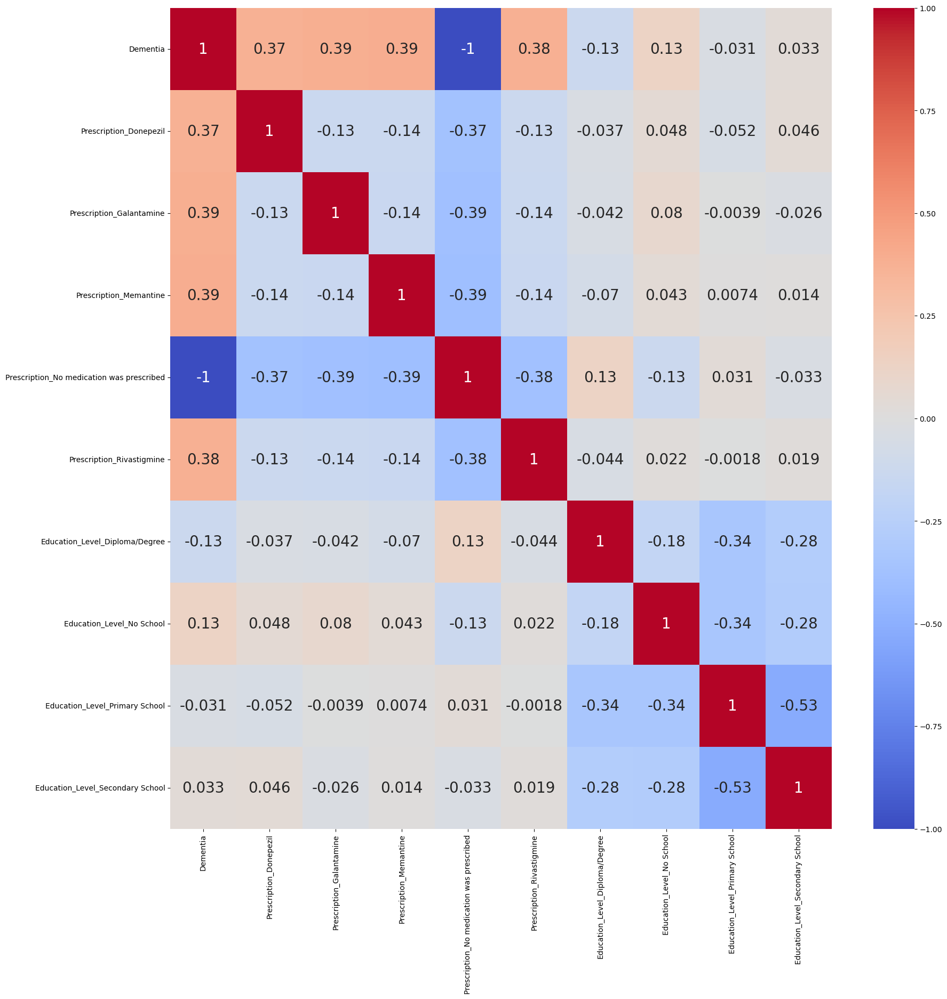

In [741]:
plt.figure(figsize=(20, 20))
sns.heatmap(dmn_df_dummies2_with_corr.iloc[10:20, 10:20], cmap='coolwarm', center=0, annot=True , annot_kws={"fontsize":20})


In [746]:
dmn_df[["AlcoholLevelGroup"]]

,AlcoholLevelGroup
0,Medium
1,Low
2,Low
3,Medium
4,High
...,...
995,Medium
996,High
997,Medium
998,Low


<Axes: xlabel='AlcoholLevelGroup', ylabel='count'>

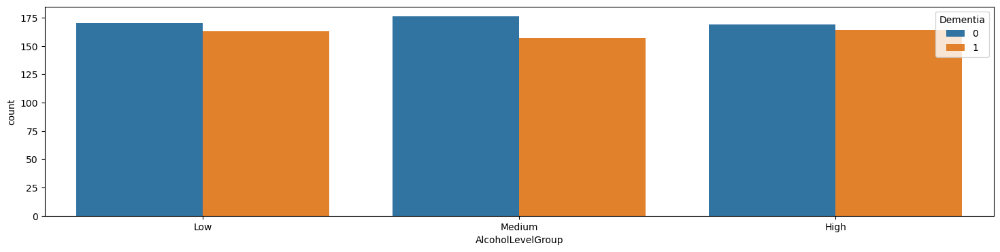

In [773]:
fig, axes = plt.subplots(figsize=(18, 4))
sns.countplot(data = dmn_df, x="AlcoholLevelGroup",hue="Dementia", order= ['Low', 'Medium', 'High'])


In [797]:
only_sick2=dmn_df[dmn_df["Dementia"] == 1]
not_sick2=dmn_df[dmn_df["Dementia"] == 0]
not_sick2

,Diabetic,AlcoholLevel,HeartRate,BloodOxygenLevel,BodyTemperature,Weight,MRI_Delay,Prescription,Dosage in mg,Age,...,APOE_ε4,Physical_Activity,Depression_Status,Cognitive_Test_Scores,Medication_History,Nutrition_Diet,Sleep_Quality,Chronic_Health_Conditions,Dementia,AlcoholLevelGroup
0,1,0.084974,98,96.230743,36.224852,57.563978,36.421028,No medication was prescribed,0.0,60,...,Negative,Sedentary,No,10,No,Low-Carb Diet,Poor,Diabetes,0,Medium
2,0,0.009000,89,93.566504,37.326321,59.759066,37.640435,No medication was prescribed,0.0,69,...,Negative,Moderate Activity,No,8,No,Mediterranean Diet,Poor,Heart Disease,0,Low
7,0,0.161158,98,92.007370,36.050294,69.653564,30.339413,No medication was prescribed,0.0,66,...,Negative,Mild Activity,No,9,Yes,Low-Carb Diet,Poor,Hypertension,0,High
8,0,0.015754,69,99.859490,36.955259,53.725078,36.629687,No medication was prescribed,0.0,66,...,Positive,Mild Activity,No,10,Yes,Mediterranean Diet,Poor,Not diagnosed with chronic illness,0,Low
10,0,0.067486,97,91.974094,37.115064,81.582755,22.281375,No medication was prescribed,0.0,73,...,Positive,Mild Activity,No,9,No,Mediterranean Diet,Good,Heart Disease,0,Medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
985,1,0.017496,75,99.859658,37.311496,59.076368,2.357196,No medication was prescribed,0.0,72,...,Positive,Sedentary,No,9,Yes,Balanced Diet,Good,Diabetes,0,Low
991,1,0.019056,84,97.759803,36.586707,75.581778,57.099717,No medication was prescribed,0.0,74,...,Negative,Moderate Activity,No,8,Yes,Mediterranean Diet,Good,Diabetes,0,Low
996,1,0.145249,97,94.522391,36.270804,94.006484,52.812568,No medication was prescribed,0.0,80,...,Negative,Moderate Activity,No,9,Yes,Low-Carb Diet,Poor,Diabetes,0,High
997,1,0.073692,65,98.578388,37.065703,80.088613,13.640229,No medication was prescribed,0.0,67,...,Positive,Sedentary,No,8,Yes,Balanced Diet,Good,Diabetes,0,Medium


<Axes: xlabel='AlcoholLevelGroup', ylabel='count'>

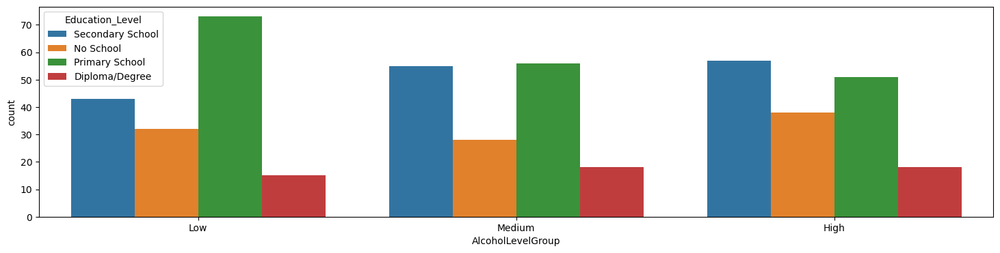

In [786]:
fig, axes = plt.subplots(figsize=(18, 4))
sns.countplot(data = only_sick2, x="AlcoholLevelGroup",hue="Education_Level", order= ['Low', 'Medium', 'High'])


<Axes: xlabel='AlcoholLevelGroup', ylabel='count'>

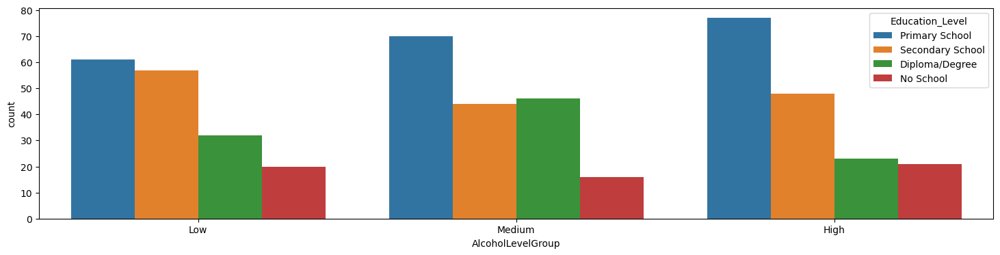

In [794]:
fig, axes = plt.subplots(figsize=(18, 4))
sns.countplot(data = not_sick2, x="AlcoholLevelGroup",hue="Education_Level", order= ['Low', 'Medium', 'High'])

<Axes: xlabel='AlcoholLevelGroup', ylabel='count'>

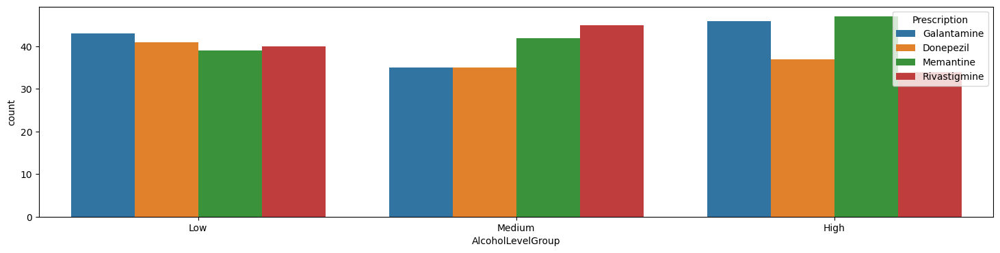

In [800]:
fig, axes = plt.subplots(figsize=(18, 4))
sns.countplot(data = only_sick2, x="AlcoholLevelGroup",hue="Prescription", order= ['Low', 'Medium', 'High'])


Text(0.5, 1.0, 'Dementia among the subjects')

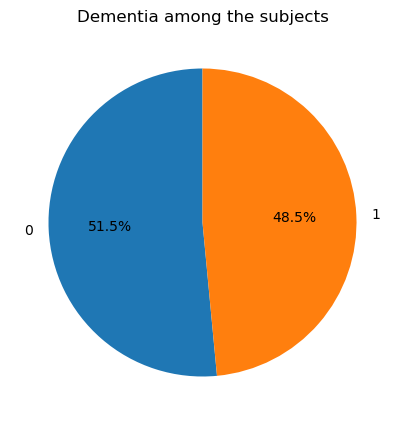

In [855]:
plt.figure(figsize=(7, 5))

dementia_counts = dmn_df['Dementia'].value_counts()

plt.pie(dementia_counts, labels=dementia_counts.index, autopct='%1.1f%%', startangle=90)
plt.title('Dementia among the subjects')


Text(0.5, 1.0, 'The distribution of the gene\n among those who are not diagnosed with dementia')

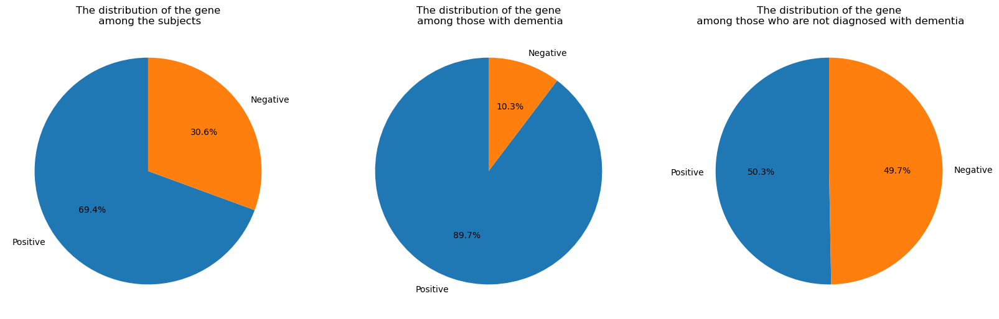

In [854]:

fig, (ax1, ax2,ax3) = plt.subplots(1,3, figsize=(20,12))

APOE_count_all = dmn_df['APOE_ε4'].value_counts()
APOE_count_sick = only_sick['APOE_ε4'].value_counts()
APOE_count_not_sick = not_sick['APOE_ε4'].value_counts()

ax1.pie(APOE_count_all, labels=APOE_count_all.index, autopct='%1.1f%%', startangle=90)
ax1.set_title("The distribution of the gene\n among the subjects")

ax2.pie(APOE_count_sick, labels=APOE_count_sick.index, autopct='%1.1f%%', startangle=90)
ax2.set_title("The distribution of the gene\n among those with dementia")

ax3.pie(APOE_count_not_sick, labels=APOE_count_not_sick.index, autopct='%1.1f%%', startangle=90)
ax3.set_title("The distribution of the gene\n among those who are not diagnosed with dementia")